In [1]:
import scipy.stats as stats
import numpy as np
import scipy.optimize as optimize
import math
import matplotlib.pyplot as plt
import pandas as pd
import torch

import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 200

log_plot = True

#Note: Need to normalize all values

/afs/crc.nd.edu/user/m/mcarlozo/.conda/envs/Toy_Problem_env/lib/python3.9/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
%%time
# Create synthetic data assuming the following values for theta
a_guess = np.array([-150,-75,-150,10, #A guess
                    0.5,0.5,-7,1, #a guess
                    -1, 1, 10, 1,#b guess
                    -8, -8, -8, 0,#c guess
                    0.5, 0.5, 0, 0])#x0 guess
#                     0.5, 0.5, 0.5, 0.5]) #y0 guess
# a_guess = np.array([-1, 1, 10, 1]) #b guess

Constants = np.array([[-200,-100,-170,15],
                      [-1,-1,-6.5,0.7],
                      [0,0,11,0.6],
                      [-10,-10,-6.5,0.7],
                      [1,0,-0.5,-1],
                      [0,0.5,1.5,1]])

num_param_guess = int(len(a_guess)/Constants.shape[1])
##New Cell
# Evaluate model and add noise based on assumed theta values
# This generates experimental data points
exp_data_doc = "Input_CSVs/Exp_Data/n=30.csv"
exp_data = pd.read_csv(exp_data_doc, header=0,sep=",",index_col=0)
Num_params  = len(exp_data.T)
Xexp = np.array([exp_data.iloc[:,0:Num_params-1]])[0,:]
Yexp = np.array([exp_data.iloc[:,-1]])[0,:]
# print(Xexp)
print(a_guess[0])
print(Constants.shape)

-150.0
(6, 4)
CPU times: user 5.34 ms, sys: 5.91 ms, total: 11.3 ms
Wall time: 9.3 ms


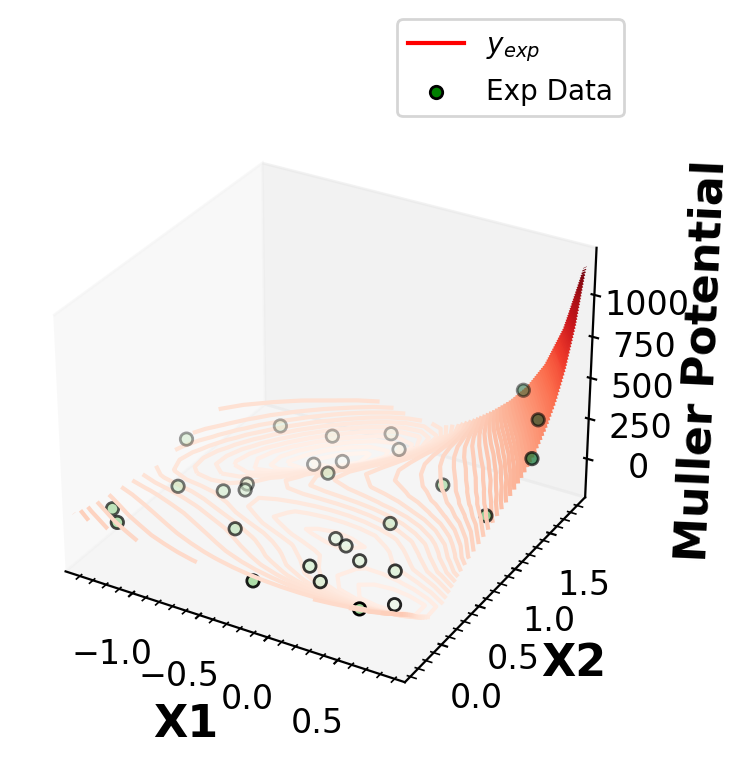

In [3]:
##New Cell

# Evaluate model based on the assumed experimental values
#Create Meshgrid for X1 and X2 and evaluate Y
len_mesh_data = 20
x1 = np.linspace(np.min(Xexp[:,0]),np.max(Xexp[:,0]),len_mesh_data)
x2 = np.linspace(np.min(Xexp[:,1]),np.max(Xexp[:,1]),len_mesh_data)
X1, X2 = np.meshgrid(x1,x2)
X_mesh = np.meshgrid(x1,x2)
# #Creates an array for Y that will be filled with the for loop
# #Initialize y_sim
Y = [] #len_data 

# #Find evey combination of X1/X2 to find the SSE for each combination
#Set constants
A, a, b, c, x0, y0 = Constants

#Calculate y_sim
#Define X1 and X2 (Need a better way do do this without for loops)
#Loop over combinations of X1 X2
for i in range(len_mesh_data):
    for j in range(len_mesh_data):
        Term1 = a*(X1[i,j] - x0)**2
        Term2 = b*(X1[i,j] - x0)*(X2[i,j] - y0)
        Term3 = c*(X2[i,j] - y0)**2
        Y.append( np.sum( A*np.exp(Term1 + Term2 + Term3) ) )
        
#Reshape to correct dimension (Is there an easier wat to do this?)        
Y = np.array(Y).reshape(len_mesh_data,-1)
# print(Y)
# Compare the experiments to the true model
fig = plt.figure()
ax = plt.axes(projection='3d')
ax.contour3D(X1, X2, Y, 100, cmap='Reds')
ax.plot(1000,1000,1000, label = "$y_{exp}$", color = 'red')
ax.scatter(1000,1000,1000, label = "Exp Data", color = 'green', edgecolors = "k")
ax.scatter3D(Xexp[:,0], Xexp[:,1], Yexp, c=Yexp, cmap='Greens', edgecolors = "k")
plt.legend(fontsize=10,bbox_to_anchor=(0, 1.0, 1, 0.2),borderaxespad=0, loc = "lower right")

ax.minorticks_on() # turn on minor ticks
ax.tick_params(direction="in",top=True, right=True) 
ax.tick_params(which="minor",direction="in",top=True, right=True)


ax.zaxis.set_tick_params(labelsize=12)
ax.yaxis.set_tick_params(labelsize=12)
ax.xaxis.set_tick_params(labelsize=12)
ax.grid(False)


ax.set_xlim((np.amin(X1),np.amax(X1)))
ax.set_ylim((np.amin(X2),np.amax(X2)))

ax.set_xlabel('X1', fontsize=16,fontweight='bold')
ax.set_ylabel('X2', fontsize=16,fontweight='bold')
ax.set_zlabel('Muller Potential',fontsize=16,fontweight='bold');

ax.locator_params(axis='y', nbins=5)
ax.locator_params(axis='x', nbins=5)
# ax.locator_params(axis='z', nbins=5)
# plt.title("Plotting True Model and Synthetic Data")
plt.show()

# Y_scaled = np.array(Y_scaled).reshape(len_mesh_data,-1)
# Y_bounds = np.array([np.min(Y_scaled), np.max(Y_scaled)])
# Y = values_scaled_to_real(Y_scaled, Y_bounds)
# Y = Y.reshape(len_mesh_data,-1)

In [4]:
##New Cell

## define function that includes nonlinear model
def model(a_guess, Constants, x):
    '''
        """
    Creates Muller potential values given a guess for "a"
    Parameters
    ----------
        a_guess: ndarray, guess value for a
        Constants: ndarray, The array containing the true values of Muller constants
        x: ndarray, Independent variable data (exp or pred)
    Returns
    -------
        y_model: ndarray, The simulated Muller potential given the guess
    '''
    #Assert statements check that the types defined in the doctring are satisfied
    
    #Converts parameters to numpy arrays if they are tensors
    if torch.is_tensor(a_guess)==True:
        a_guess = a_guess.numpy()
        
    if isinstance(a_guess, pd.DataFrame):
        a_guess = a_guess.to_numpy()
    
    #Initialize y_sim, set len_data and dim_x
    len_x_shape = len(x.shape) #Will tell us whether we're looking at Xexp or Xmesh
        
    if len_x_shape < 3:
        len_x_data = x.shape[0]
        y_model = np.zeros(len_x_data)
        
    else:
        len_x_data = x.shape[1]
        y_model = np.zeros((len_x_data, len_x_data))
    
    #Set dig out values of a from train_p
    #Set constants to change the a row to the index of the first loop
    Constants_local = np.copy(Constants)
    dim_guess = int(len(a_guess)/Constants.shape[1])
    a_guess = a_guess.reshape(dim_guess,-1)
    
    for i in range(dim_guess):
        Constants_local[i] = a_guess[i]#Since we've chosen A, a, b, c, x0, and y0
    
#     print(a_guess)
#     print(Constants_local)
    A, a, b, c, x0, y0 = Constants_local
#     print(a,A)

    #Iterates over Xexp to find the y for each combination
    for i in range(len_x_data):
        #Calculate y_sim
        if len_x_shape < 3:
            X1, X2 = x[i,0], x[i,1]
            Term1 = a*(X1 - x0)**2
            Term2 = b*(X1 - x0)*(X2 - y0)
            Term3 = c*(X2 - y0)**2
            y_model[i] = np.sum(A*np.exp(Term1 + Term2 + Term3) )
        else:
        #loop over all i and j
            X1, X2 = x
            for i in range(len_x_data):
                for j in range(len_x_data):
                    Term1 = a*(X1[i,j] - x0)**2
                    Term2 = b*(X1[i,j] - x0)*(X2[i,j] - y0)
                    Term3 = c*(X2[i,j] - y0)**2
                    y_model[i,j] = ( np.sum( A*np.exp(Term1 + Term2 + Term3) ) )
   
    if not len_x_shape < 3:
        y_model = y_model.reshape(len_x_data, -1)
    
    return y_model

# print(model(a_guess,Constants,Xexp))

##New Cell

# Create a function to optimize, in this case, least squares fitting
def regression_func(a_guess, Constants, x, y):
    '''
    Function to define regression function for least-squares fitting
    Arguments:
        a_guess: ndarray, guess value for a
        Constants: ndarray, The array containing the true values of Muller constants
        x: ndarray, experimental X data (Inependent Variable)
        y: ndarray, experimental Y data (Dependent Variable)
    Returns:
        e: residual vector
    '''
    
    error = y - model(a_guess, Constants, x); #NOTE: Least squares will calculate sse based off this to minimize
    
    return error

# print(regression_func(a_guess, Constants, Xexp, Yexp))


In [5]:

## specify initial guess
a0 = a_guess
#Define # of dimensions
try:
    d = a_guess.shape[0]*a_guess.shape[1]
except:
    d = a_guess.shape[0]
## specify bounds
# first array: lower bounds
# second array: upper bounds
lower = np.repeat(-np.inf, d)
upper = np.repeat(np.inf, d)
bounds = (lower, upper) 

## use least squares optimizer in scipy
# argument 1: function that takes theta as input, returns residual
# argument 2: initial guess for theta
# optional arguments 'bounds': bounds for theta
# optional arugment 'args': additional arguments to pass to residual function
# optional argument 'method': select the numerical method
#   if you want to consider bounds, choose 'trf'
#   if you do not want to consider bounds, try either 'lm' or 'trf'
Solution = optimize.least_squares(regression_func, a0 ,bounds=bounds, method='trf',args=(Constants, Xexp, Yexp),verbose=2)

a_model = Solution.x
a_model_soln = a_model.reshape(num_param_guess,-1)
print("a = ",a_model_soln)
print("Constants", Constants)

   Iteration     Total nfev        Cost      Cost reduction    Step norm     Optimality   
       0              1         5.3611e+05                                    1.30e+06    
       1              6         1.7612e+05      3.60e+05       8.83e-01       1.69e+05    
       2              8         6.4558e+04      1.12e+05       4.41e-01       2.92e+05    
       3              9         2.3078e+04      4.15e+04       8.83e-01       2.53e+04    
       4             10         1.2659e+04      1.04e+04       1.77e+00       4.70e+04    
       5             11         6.7693e+03      5.89e+03       3.53e+00       7.91e+04    
       6             13         2.0741e+03      4.70e+03       8.83e-01       1.93e+04    
       7             15         1.2288e+03      8.45e+02       4.41e-01       4.71e+03    
       8             16         9.1388e+02      3.15e+02       8.83e-01       3.82e+03    
       9             17         6.2086e+02      2.93e+02       8.83e-01       8.08e+02    

In [6]:
def sse_func(a_model, x, y, P_inds, P1_vals, P2_vals):
    '''
    Function to define define sum of squared error function for heat map
    Arguments:
        xx: An N X D array of all a_1 values
        yy: An D X N array of all a_2 values
        x: independent variable vector (predicted x values including noise)
        y: dependent variable vector (predicted y values on Heat Map)
    Returns:
        sse: N x N sum of squared error matrix of all generated combination of xx and yy
    '''
    #Meshgrid
    P1_mesh, P2_mesh = np.meshgrid(P1_vals,P2_vals)
    #Copy Center Point
    a_guess_local = np.copy(a_model)
    
    #Initialize SSE Maxtrix
    sse = np.zeros((len(P1_mesh),len(P2_mesh)))
    
    #Calculate SSE
    for i in range(len(P1_mesh)):
        for j in range(len(P2_mesh)):
            a_guess_local[P_inds[0]] = P1_mesh[i,j]
            a_guess_local[P_inds[1]] = P2_mesh[i,j]
#             print(a_guess_local)
            sse[i,j] = sum((y - model(a_guess_local, Constants, x))**2) 
    
    return sse

In [7]:
# a1, a2, a3, a4 = np.meshgrid(a1_lin, a2_lin, a3_lin, a4_lin)
# a_guesses = np.meshgrid(a1_lin, a2_lin, a3_lin, a4_lin)

# P_inds = np.array([0,3])
# print(sse_func(a_model, Xexp, Yexp, P_inds, a1_lin, a2_lin))

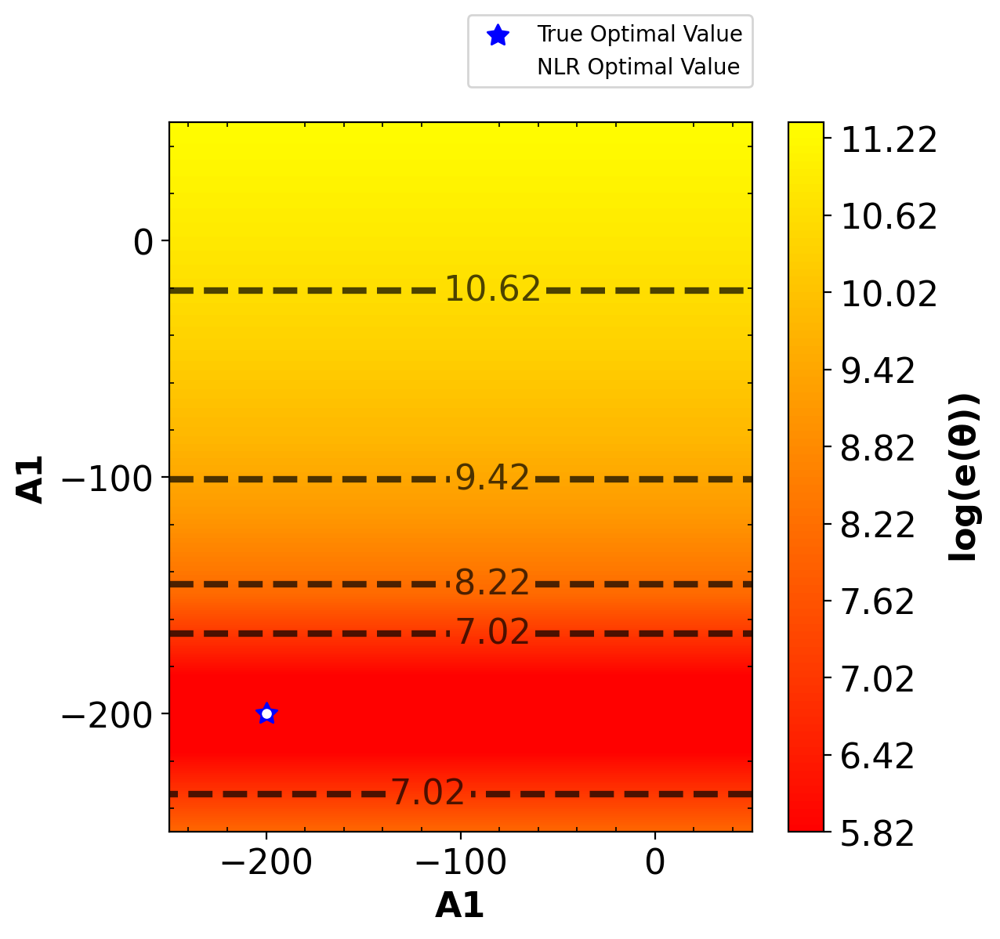

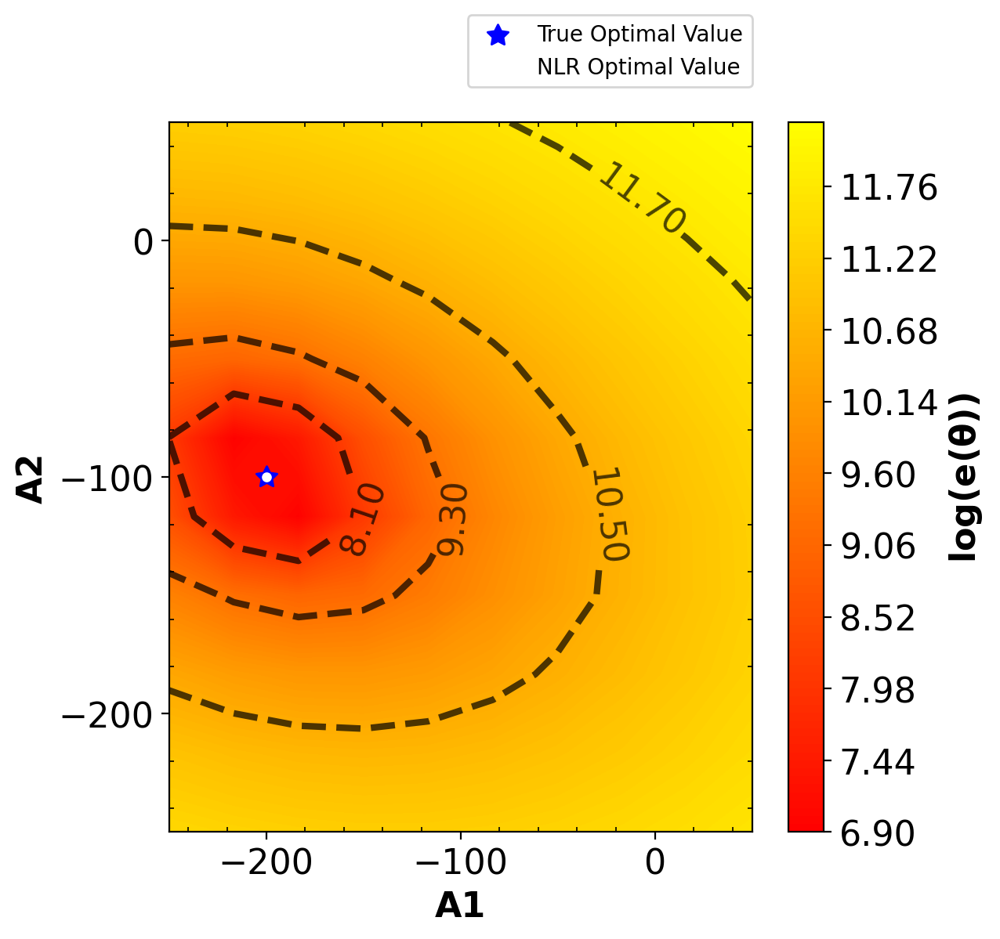

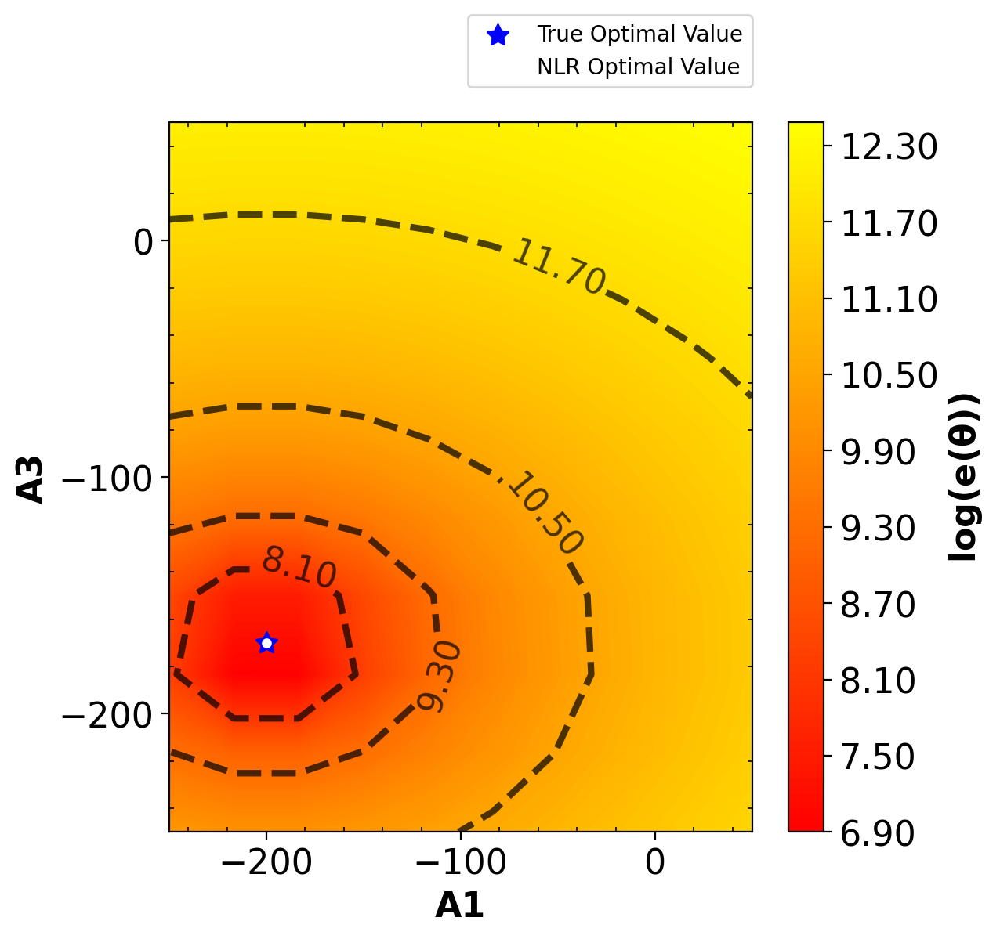

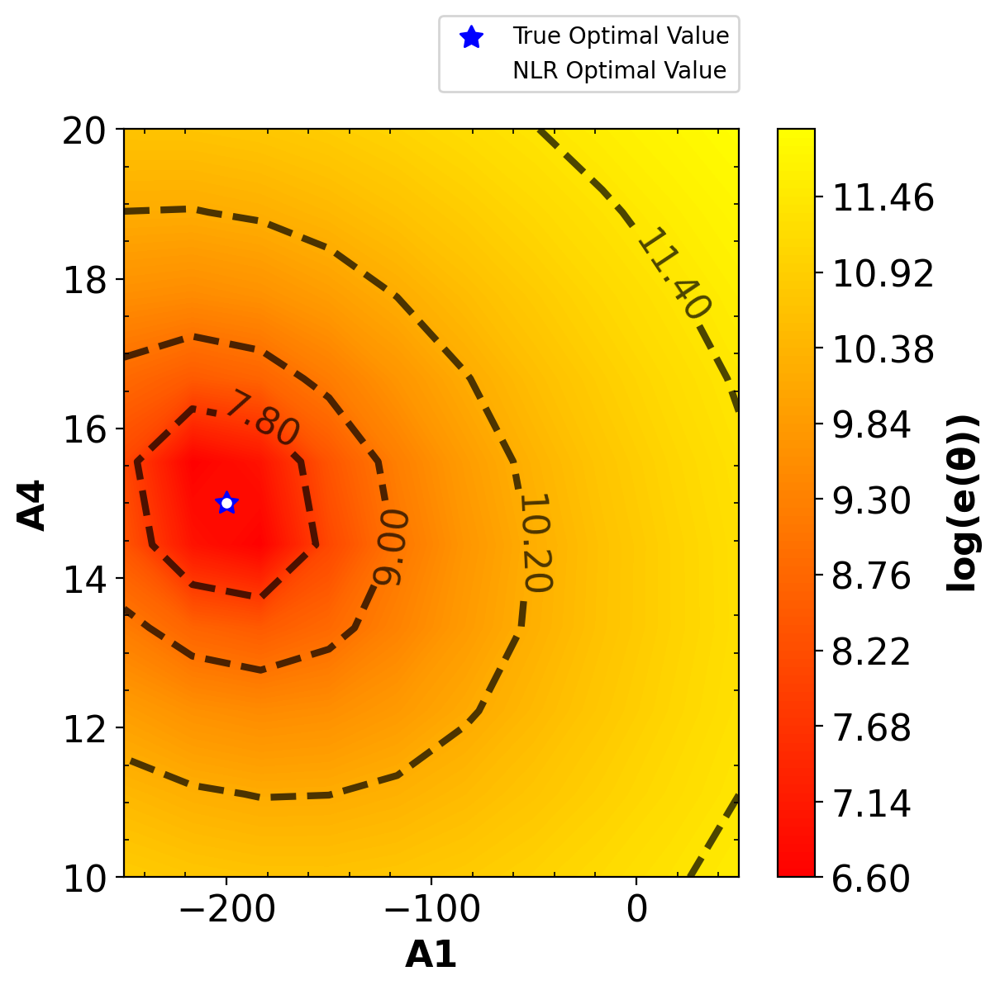

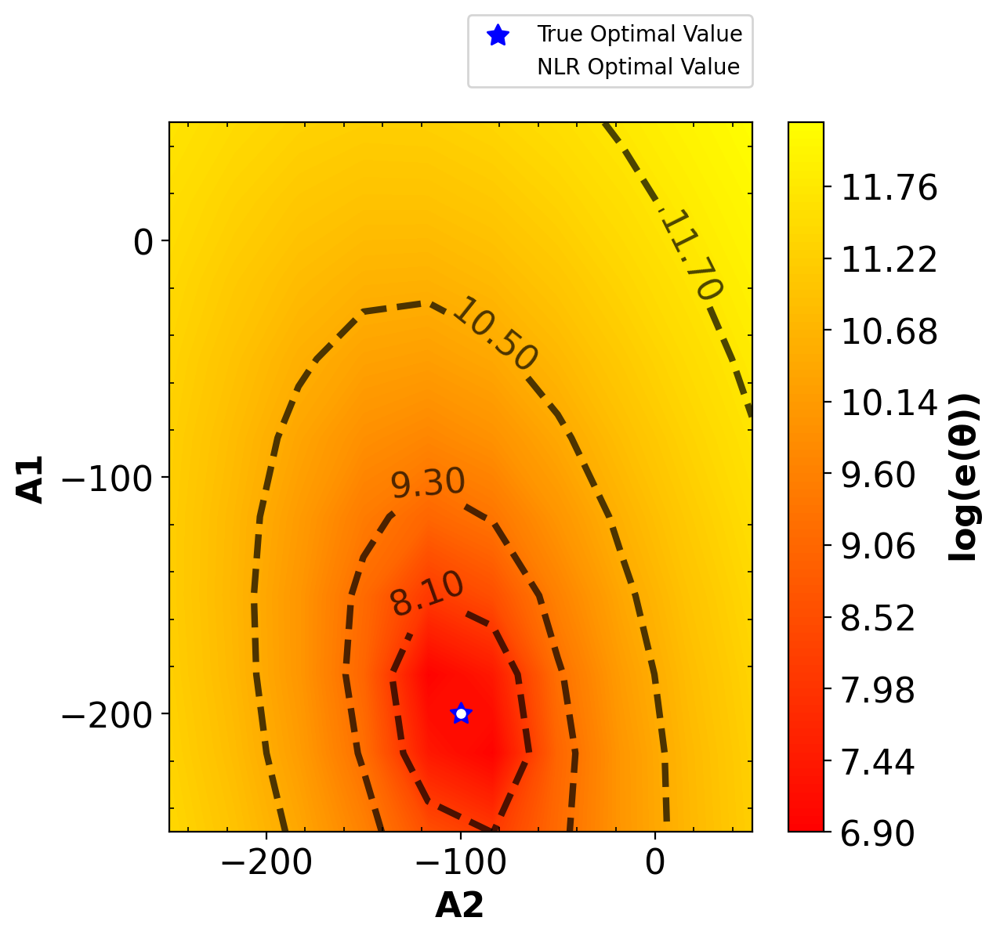

...

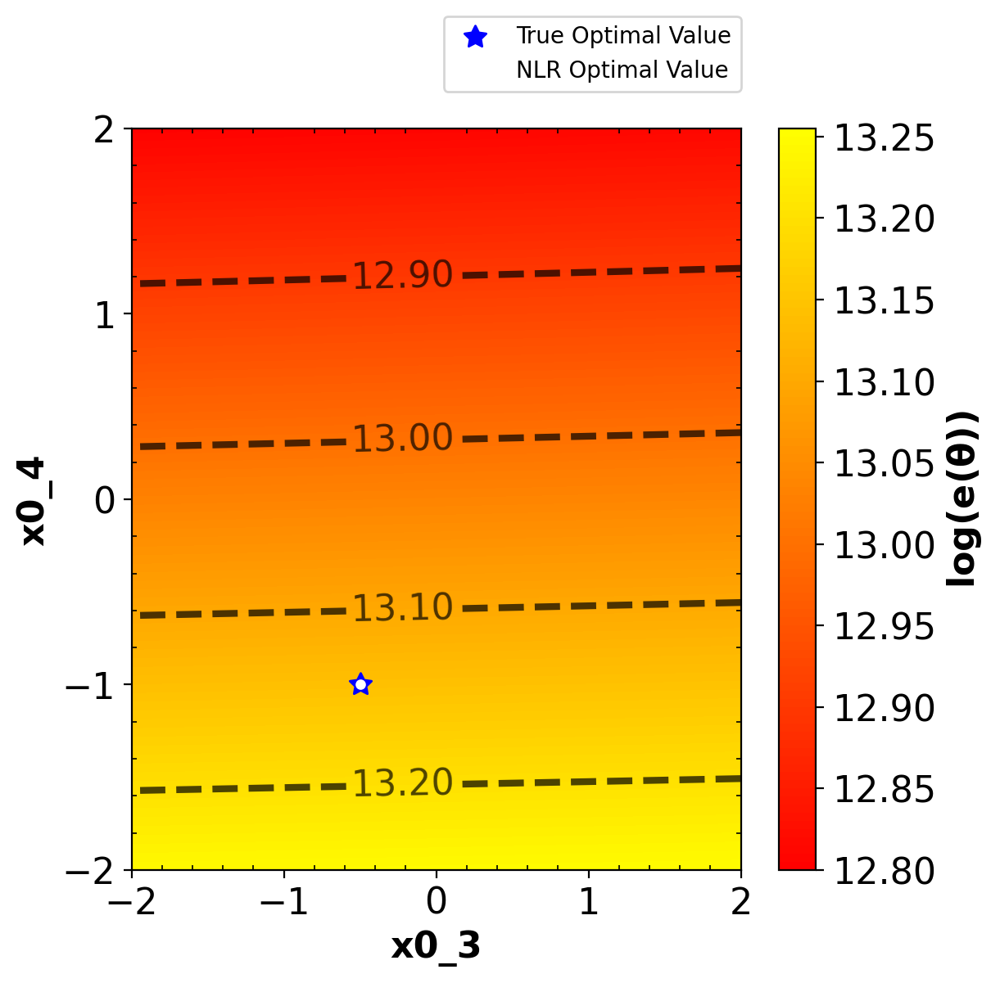

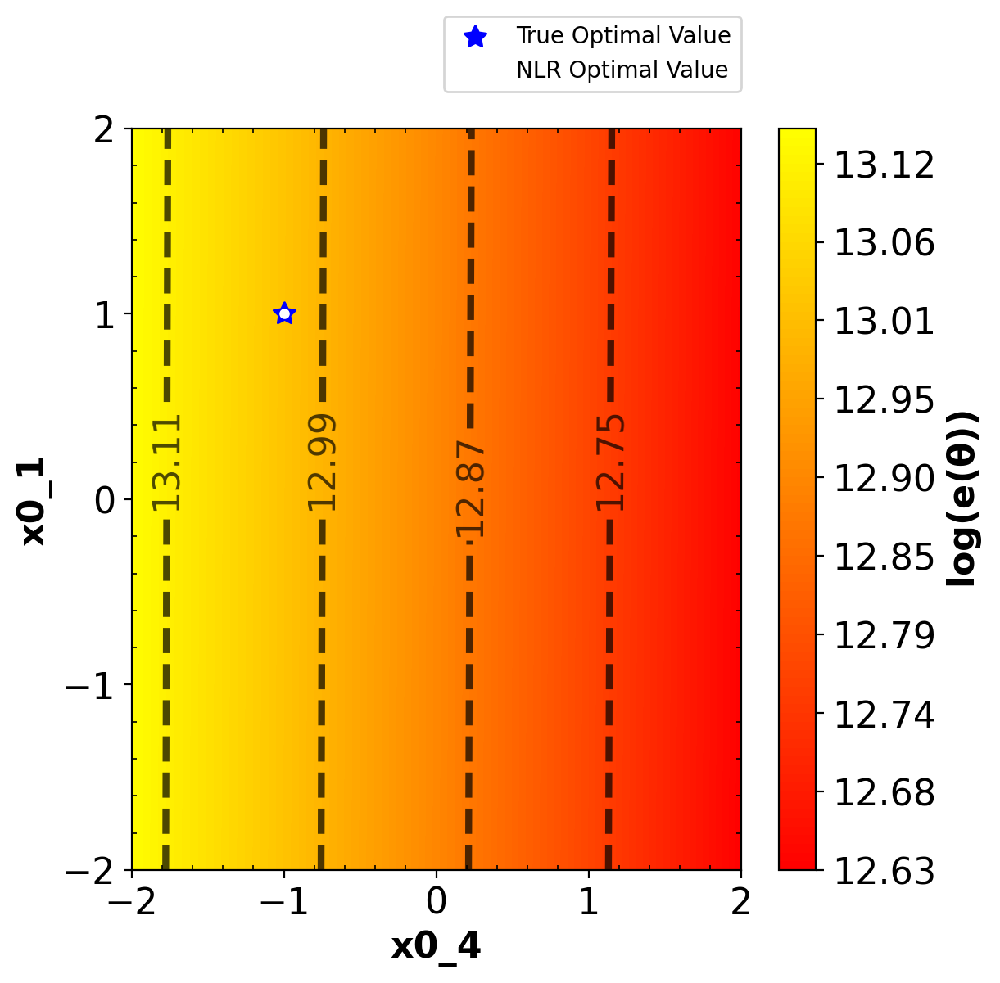

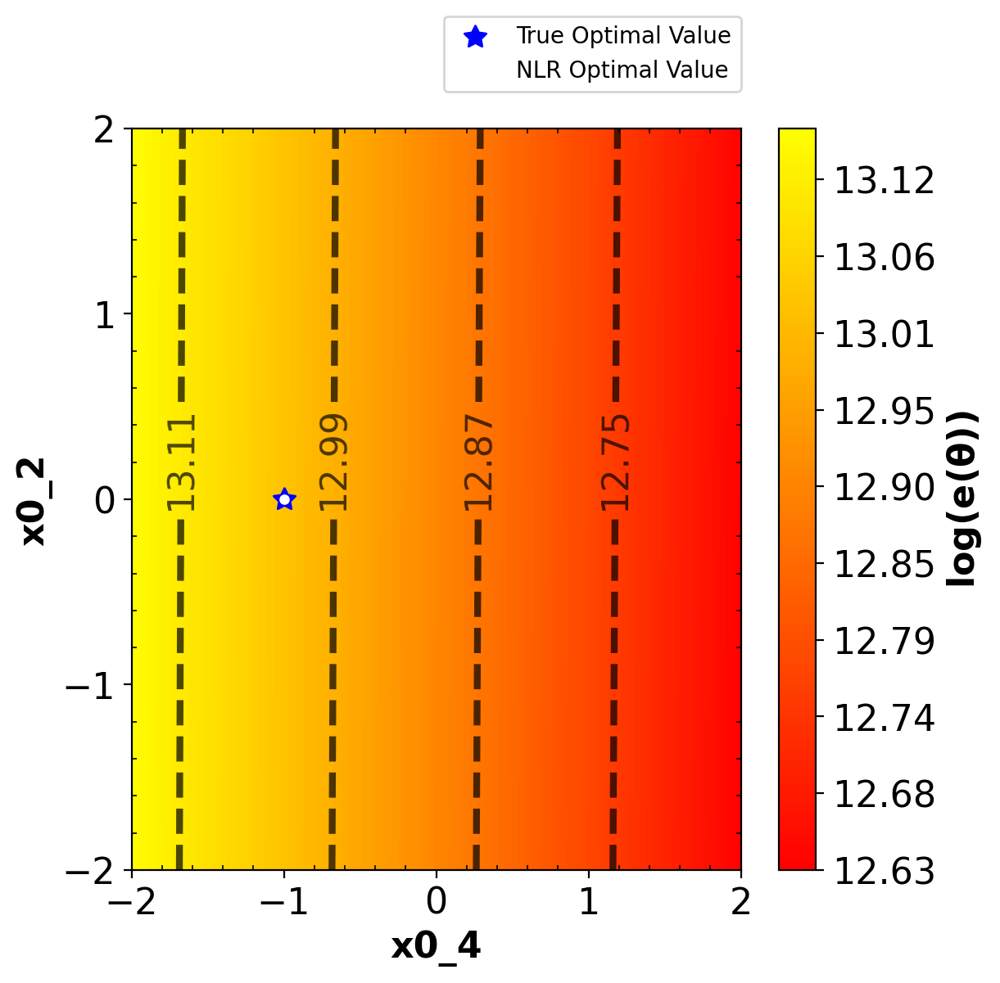

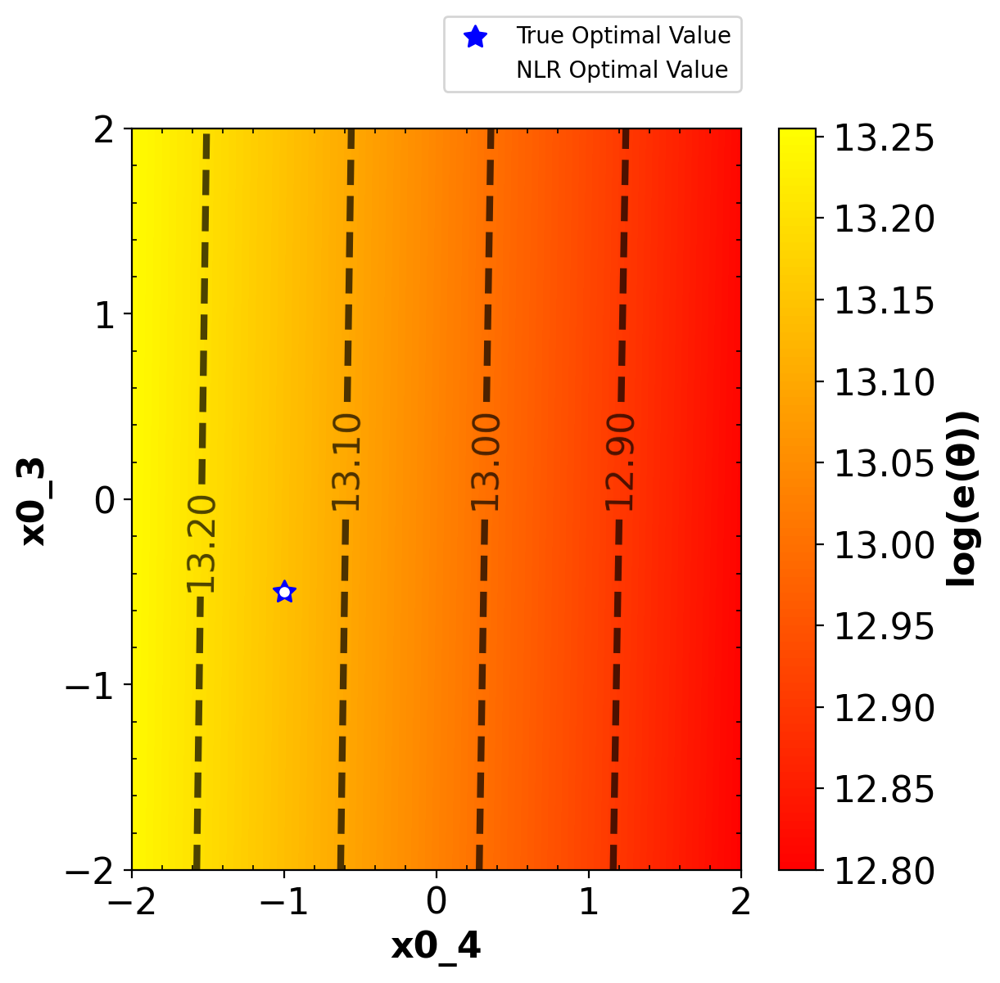

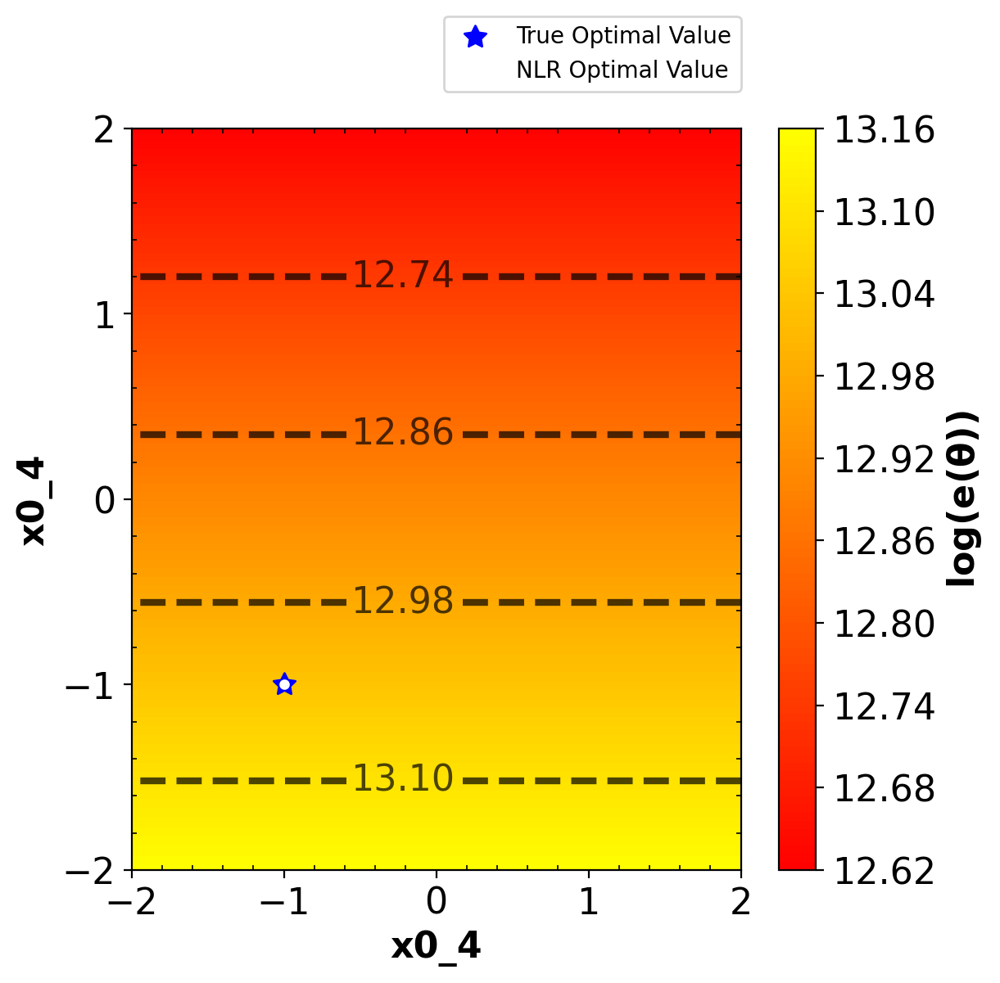

In [8]:
#New Cell
log_plot = True

# generate predictions
X_pred = np.array(X_mesh)
Y_pred = model(a_guess, Constants, X_pred)

#Generate Guesses for a1-a4
a1_lin = a2_lin = np.linspace(-2,0,10)
a3_lin = np.linspace(-10,2,10)
a4_lin = b1_lin = b2_lin = b4_lin = c4_lin = np.linspace(-2,2,10)
A1_lin = A2_lin = A3_lin = np.linspace(-250,50,10)
A4_lin = np.linspace(10,20,10)
b3_lin = np.linspace(8,12,10)
b4_lin = np.linspace(-2,2,10)
c1_lin = np.linspace(-12,-8,10)
c2_lin = np.linspace(-12,-8,10)
c3_lin = np.linspace(-10,-6,10)

x0_1_lin = x0_2_lin = x0_3_lin = x0_4_lin = np.linspace(-2,2,10)
# y0_1_lin = y0_2_lin = y0_3_lin = y0_4_lin = np.linspace(-2,2,10)


axis_list = [A1_lin, A2_lin, A3_lin, A4_lin,
             a1_lin, a2_lin, a3_lin, a4_lin, 
             b1_lin, b2_lin, b3_lin, b4_lin, 
             c1_lin, c2_lin, c3_lin, c4_lin,
             x0_1_lin, x0_2_lin, x0_3_lin, x0_4_lin]
#              y0_1_lin, y0_2_lin, y0_3_lin, y0_4_lin]

axis_label_list = ["A1", "A2", "A3", "A4",
                   "a1", "a2", "a3", "a4",
                   "b1", "b2", "b3", "b4",
                   "c1", "c2", "c3", "c4",
                   "x0_1", "x0_2", "x0_3", "x0_4",
                   "y0_1", "y0_2", "y0_3", "y0_4",]

#Loop over combinations of axes and create heatmaps
#How to do this with a for loop?
for k in range(num_param_guess):
    for i in range(Constants.shape[1]):
        for j in range(Constants.shape[1]):
            P_inds = np.array([i,j])
            P1_vals = axis_list[P_inds[0]+k*Constants.shape[1]]
            P2_vals = axis_list[P_inds[1]+k*Constants.shape[1]]
            #Use a_guesses to create heat map
            zz = sse_func(a_model, Xexp, Yexp, P_inds, P1_vals, P2_vals)

            if log_plot == True:
                zz = np.log(zz)
            #Better way to do this?
            plt.figure(figsize = (6,6))

            plt.contourf(P1_vals,P2_vals, zz, cmap = "autumn", levels = 100)
#             plt.colorbar()
            
            cs = plt.contourf(P1_vals,P2_vals, zz, cmap = "autumn", levels = 100)
                    # plot color bar
            if np.amax(zz) < 1e-1:
                cbar = plt.colorbar(cs, format='%.2e')
            else:
                cbar = plt.colorbar(cs, format = '%2.2f')

            # plot title in color bar
            cbar.ax.set_ylabel(r'$\mathbf{log(e(\theta))}$', fontsize=16, fontweight='bold')
        #     print(p_GP_opt[0],p_GP_opt[1])

            # set font size in color bar
            cbar.ax.tick_params(labelsize=16)

            # Plot equipotential line
            cs2 = plt.contour(cs, levels=cs.levels[::20], colors='k', alpha=0.7, linestyles='dashed', linewidths=3)

            #Plot heatmap label

            if np.amax(zz) < 1e-1:
                plt.clabel(cs2, fmt='%.2e', colors='k', fontsize=16)
            else:
                plt.clabel(cs2, fmt='%2.2f', colors='k', fontsize=16)
                
            plt.axis()
            plt.scatter(Constants[k][P_inds[0]],Constants[k][P_inds[1]], color="blue", s=100, 
                        label = "True Optimal Value", marker = (5,1)) #k +1 since we chose a&b
            plt.scatter(a_model_soln[k][P_inds[0]],a_model_soln[k][P_inds[1]], color="white",s=50, marker = ".",
                        label = "NLR Optimal Value")
            # plt.grid()
            plt.legend(fontsize=10,bbox_to_anchor=(0, 1.05, 1, 0.2),borderaxespad=0, loc = "lower right")
            plt.xlabel(axis_label_list[P_inds[0]+k*Constants.shape[1]],fontsize=16,fontweight='bold')
            plt.ylabel(axis_label_list[P_inds[1]+k*Constants.shape[1]],fontsize=16,fontweight='bold')
            
            plt.xlim((np.amin(P1_vals), np.amax(P1_vals)))
            plt.ylim((np.amin(P2_vals),np.amax(P2_vals)))
            
            plt.minorticks_on() # turn on minor ticks
            plt.xticks(fontsize=16)
            plt.yticks(fontsize=16)
            plt.tick_params(which="minor",direction="in",top=True, right=True)
            plt.locator_params(axis='y', nbins=5)
            plt.locator_params(axis='x', nbins=5)

#             if log_plot == True:
#                 plt.title('NLR ln(SSE)', weight='bold',fontsize = 16)
#     #             plt.savefig("Figures/NLR_ln(SSE).png",dpi=300)
#             else:
#                 plt.title('Non-Linear Regression SSE', weight='bold',fontsize = 16)
#     #             plt.savefig("Figures/NLR_SSE.png",dpi=300)

            plt.show()

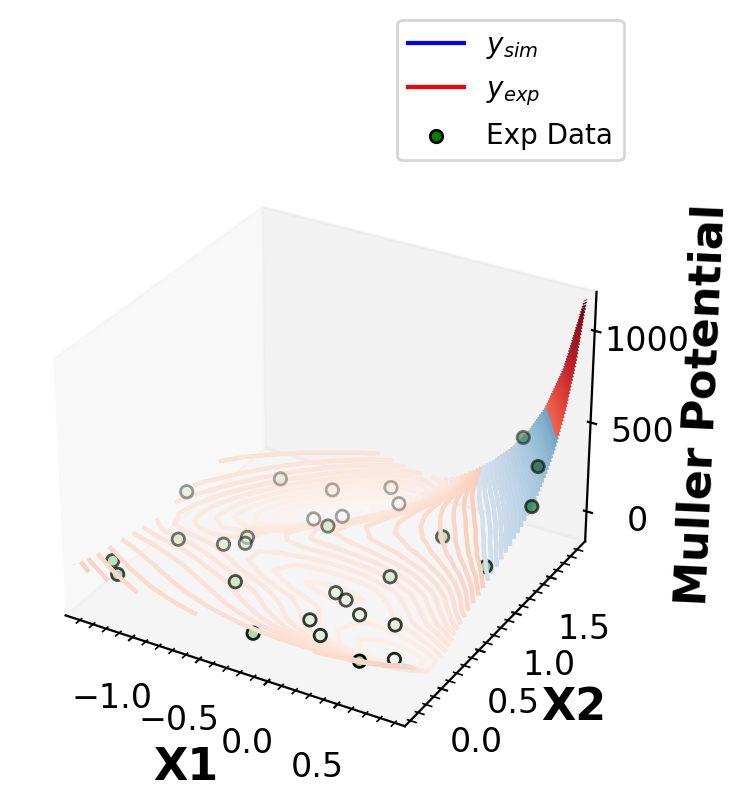

In [9]:
#New Cell
X_pred = np.array(np.meshgrid(x1,x2))
Y_pred = model(a_model, Constants, X_pred)


# create plot and compare predictions and experiments
fig = plt.figure(figsize = (6.4,4))
ax = plt.axes(projection='3d')
ax.contour3D(X1, X2, Y_pred, 100, cmap='Blues')
ax.contour3D(X1, X2, Y, 100, cmap='Reds')
ax.scatter3D(Xexp[:,0], Xexp[:,1], Yexp, c=Yexp, cmap='Greens', edgecolors = "k")
ax.plot(1000,1000,1000, label = "$y_{sim}$", color = 'blue')
ax.plot(1000,1000,1000, label = "$y_{exp}$", color = 'red')
ax.scatter(1000,1000,1000, label = "Exp Data", color = 'green', edgecolors = "k")
plt.legend(fontsize=10,bbox_to_anchor=(0, 1.0, 1, 0.2),borderaxespad=0, loc = "lower right")

ax.minorticks_on() # turn on minor ticks
ax.tick_params(direction="in",top=True, right=True) 
ax.tick_params(which="minor",direction="in",top=True, right=True)

ax.locator_params(axis='y', nbins=5)
ax.locator_params(axis='x', nbins=5)
ax.locator_params(axis='z', nbins=5)

ax.zaxis.set_tick_params(labelsize=12)
ax.yaxis.set_tick_params(labelsize=12)
ax.xaxis.set_tick_params(labelsize=12)
ax.grid(False)

ax.set_xlim((np.amin(X1),np.amax(X1)))
ax.set_zlim(np.amin(Y),np.amax(Y))
ax.set_xlim(np.amin(X1),np.amax(X1))
ax.set_ylim(np.amin(X2),np.amax(X2))
ax.set_xlabel('X1', fontsize=16,fontweight='bold')
ax.set_ylabel('X2', fontsize=16,fontweight='bold')
ax.set_zlabel('Muller Potential', fontsize=16,fontweight='bold')
ax.zaxis._axinfo['label']['space_factor'] = 2
# plt.title("Predictions vs Synthetic Data")
plt.show()

# plt.savefig("Figures/sim_true_comp.png",dpi=300)
# plt.show()

SSE =  1.4936470049663746e-11


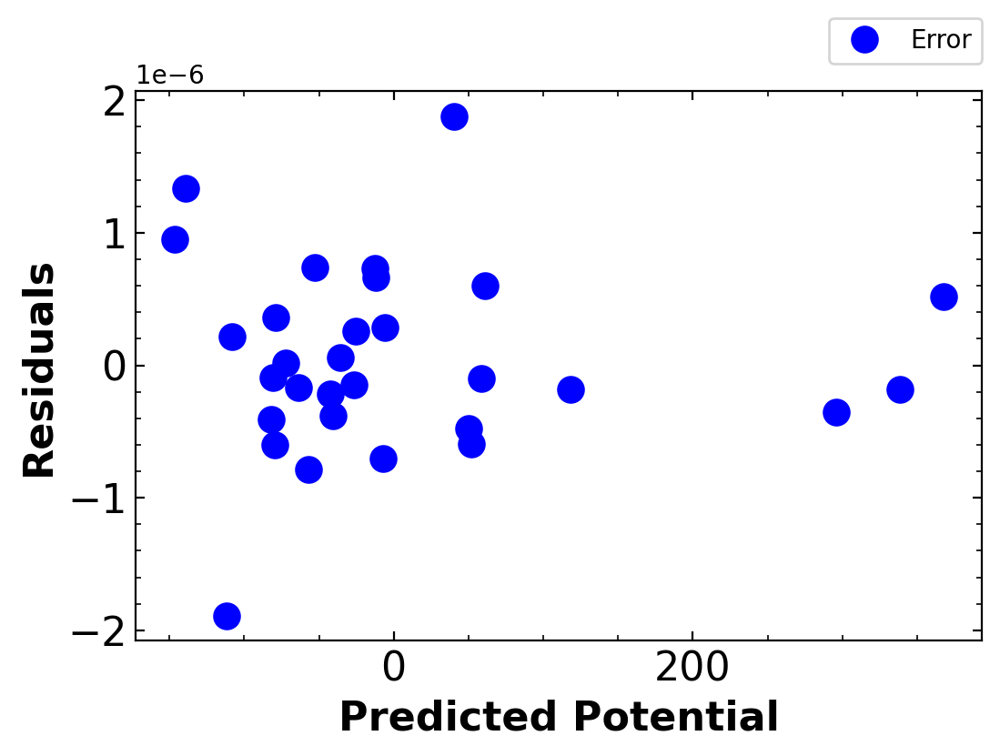

In [10]:
#Plot error
Y_pred_of_exp = model(a_model, Constants, Xexp)
error = (Yexp - Y_pred_of_exp)
print("SSE = ", np.sum(error**2))
plt.plot(Y_pred_of_exp,error,"b.",markersize=20, label = "Error")

plt.legend(fontsize=10,bbox_to_anchor=(0, 1.05, 1, 0.2),borderaxespad=0, loc = "lower right")

plt.minorticks_on() # turn on minor ticks
plt.tick_params(direction="in",top=True, right=True) 
plt.tick_params(which="minor",direction="in",top=True, right=True)

plt.locator_params(axis='y', nbins=5)
plt.locator_params(axis='x', nbins=5)

plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

plt.grid(False)

# plt.title("Residuals")
plt.xlabel('Predicted Potential', fontsize=16,fontweight='bold')
plt.ylabel('Residuals', fontsize=16,fontweight='bold')
plt.show()

In [11]:
#Jacobian and Uncertainty Analysis
print("Jacobian =\n")
print(Solution.jac)
sigre = (error.T @ error)/(len(error) - 2)
Sigma_theta2 = sigre * np.linalg.inv(Solution.jac.T @ Solution.jac)
print("Covariance matrix:\n",Sigma_theta2)

Jacobian =

[[-0.00000000e+00 -0.00000000e+00 -5.71591334e-02 -2.32088782e+01
  -0.00000000e+00 -0.00000000e+00  9.97084550e+00 -7.96909634e+02
  -0.00000000e+00 -0.00000000e+00  4.63924759e+00 -5.11609806e+02
  -0.00000000e+00 -0.00000000e+00  2.15855458e+00 -3.28449539e+02
   0.00000000e+00  0.00000000e+00  7.75826416e+01  9.40292637e+02]
 [-4.75645106e-07 -1.99317463e-02 -1.27333391e-01 -1.19009052e+00
   5.76019210e-04  4.25048399e+00  1.99626623e+01 -3.78252101e+00
  -2.15768814e-04 -1.22901750e+00  1.20101211e+01 -6.38919115e-01
   8.09192532e-05  3.55367471e-01  7.22563878e+00 -1.07922077e-01
  -4.68254089e-04 -5.82132483e+00 -1.32668276e+02 -1.23369482e+01]
 [-0.00000000e+00 -4.38690202e-07 -9.06826354e-01 -2.80766955e+00
  -0.00000000e+00  1.90734863e-06  8.04149620e+00 -2.23443804e+01
  -0.00000000e+00 -1.52587891e-05  7.33975935e+00 -2.17329855e+01
  -0.00000000e+00  6.16073528e-05  6.69925929e+00 -2.11383209e+01
   0.00000000e+00 -2.28881836e-05  1.04215769e+02  6.08489552e

In [12]:
import scipy.linalg as linalg
val, vec = linalg.eig(Sigma_theta2)
print(val)
print(vec)

[8.66897856e-11+0.j 8.91778139e-13+0.j 3.81247851e-13+0.j
 1.25467834e-13+0.j 5.72870023e-14+0.j 4.38803219e-14+0.j
 1.67955197e-14+0.j 7.46753106e-15+0.j 2.49314097e-15+0.j
 2.82612959e-15+0.j 7.33503697e-16+0.j 5.55346913e-16+0.j
 2.94061933e-16+0.j 3.71765547e-17+0.j 2.17758017e-17+0.j
 1.07071466e-17+0.j 4.10330683e-18+0.j 7.79578264e-20+0.j
 2.02218632e-18+0.j 1.53966891e-18+0.j]
[[ 9.98982469e-01 -2.70711126e-02 -2.32001851e-02  9.58995034e-03
   1.62102725e-02 -3.31497453e-03 -5.20418773e-03  1.31938714e-02
   1.65754986e-03 -6.73944296e-05 -1.08210912e-03  1.31394855e-02
  -3.18943014e-03  2.23012830e-04 -8.12991295e-05  2.11088263e-03
  -1.78526286e-03 -4.67946063e-05  1.24798229e-03  2.01640439e-04]
 [ 3.31325759e-02  8.47201631e-01  4.37814227e-01  2.33344236e-01
  -1.54194149e-01  7.35201969e-02 -2.46898476e-02  3.87350934e-02
  -3.11772247e-03  5.42260138e-02  1.70776764e-02 -1.32692195e-02
  -1.70786955e-02  3.41942798e-03  2.16645630e-03  1.52943130e-03
  -8.05974932e-04